# GEOMETRÍA DEL DETECTOR Y HITS

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import torch
from torch_geometric.data import Data
from IPython.display import display

from scripts.data_prep import space_batches, process_event_batches
from scripts.utils import denormalize_graph




n_event = '000001000'
event_name = '000001000'

hits = pd.read_csv(f'data/events/event{n_event}-hits.csv')
particles = pd.read_csv(f'data/events/event{n_event}-particles.csv')
truth = pd.read_csv(f'data/events/event{n_event}-truth.csv')

df = hits.copy()

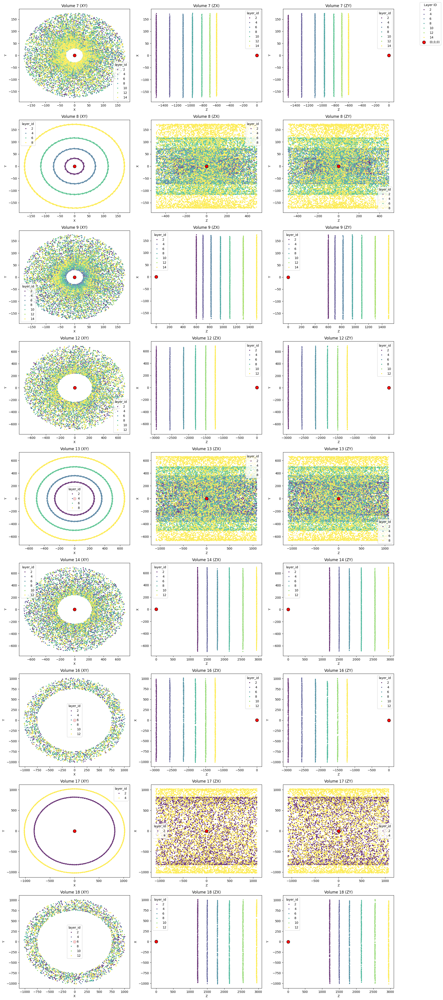

In [2]:
volume_ids = df['volume_id'].unique().tolist()


fig, axes = plt.subplots(len(volume_ids), 3, figsize=(18, 5 * len(volume_ids)))


for i, vol_id in enumerate(volume_ids):
    df_vol = df[df['volume_id'] == vol_id]  
    
 
    sns.scatterplot(data=df_vol, x='x', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[i, 0])
    axes[i, 0].set_title(f'Volume {vol_id} (XY)')
    axes[i, 0].set_xlabel('X')
    axes[i, 0].set_ylabel('Y')
    axes[i, 0].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')


    sns.scatterplot(data=df_vol, x='z', y='x', hue='layer_id', palette='viridis', s=10, ax=axes[i, 1])
    axes[i, 1].set_title(f'Volume {vol_id} (ZX)')
    axes[i, 1].set_xlabel('Z')
    axes[i, 1].set_ylabel('X')
    axes[i, 1].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')


    sns.scatterplot(data=df_vol, x='z', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[i, 2])
    axes[i, 2].set_title(f'Volume {vol_id} (ZY)')
    axes[i, 2].set_xlabel('Z')
    axes[i, 2].set_ylabel('Y')
    axes[i, 2].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')


handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title='Layer ID', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


   volume_id  layer_id      x_min      x_max      y_min      y_max     z_min  \
0          8         2   -34.3765    34.3559   -34.3825    34.3712  -489.834   
1          8         4   -73.8250    73.8731   -73.8561    73.8279  -490.474   
2          8         6  -117.6610   117.7020  -117.7020   117.6960  -490.529   
3          8         8  -173.5390   173.5690  -173.4180   173.5200  -490.777   
4         13         2  -266.0580   265.9340  -266.1150   265.7530 -1081.000   
5         13         4  -365.7140   365.5360  -365.7860   365.8200 -1083.400   
6         13         6  -505.0290   505.4300  -505.3420   505.0770 -1083.400   
7         13         8  -665.2590   664.7120  -665.1960   665.0700 -1083.400   
8         17         2  -824.3440   825.0100  -825.0840   824.8840 -1078.600   
9         17         4 -1024.8400  1025.3300 -1025.1100  1024.8500 -1078.600   

      z_max  
0   489.429  
1   490.782  
2   490.692  
3   490.684  
4  1082.800  
5  1083.400  
6  1083.400  
7  1081

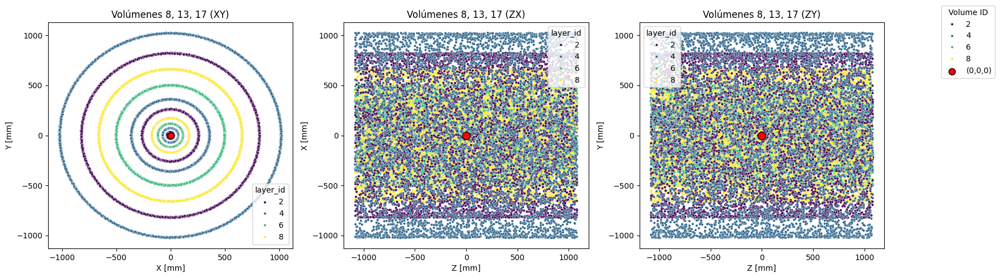

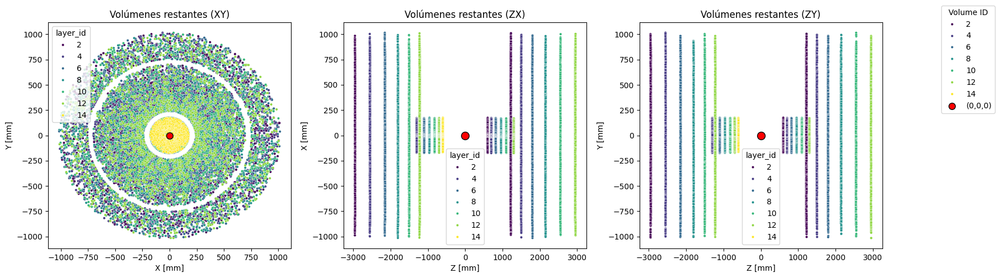

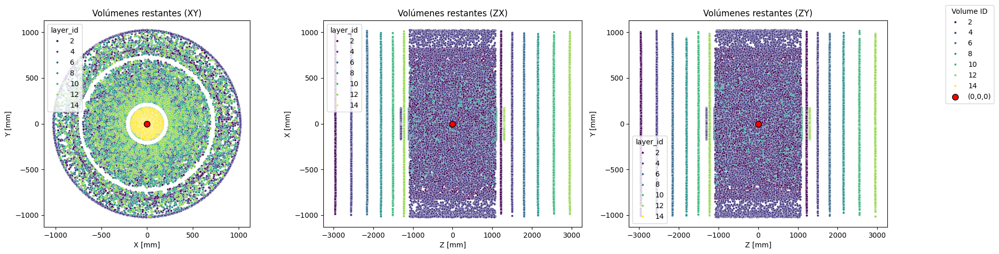

In [3]:
barrels = [(8,2), (8,4), (8,6), (8,8), (13,2), (13,4), (13,6), (13,8), (17,2), (17,4)]


barrel_hits = hits[hits[['volume_id', 'layer_id']].apply(tuple, axis=1).isin(barrels)]
ranges = barrel_hits.groupby(['volume_id', 'layer_id'])[['x', 'y', 'z']].agg(['min', 'max']).reset_index()
ranges.columns = ['volume_id', 'layer_id', 'x_min', 'x_max', 'y_min', 'y_max', 'z_min', 'z_max']
print(ranges)

df_filtered = df[df['volume_id'].isin([8, 13, 17])]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))




sns.scatterplot(data=df_filtered, x='x', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[0])
axes[0].set_title('Volúmenes 8, 13, 17 (XY)')
axes[0].set_xlabel('X [mm]')
axes[0].set_ylabel('Y [mm]')
axes[0].scatter(0, 0, color='red', s=70, edgecolor='black', label='(0,0,0)')

sns.scatterplot(data=df_filtered, x='z', y='x', hue='layer_id', palette='viridis', s=10, ax=axes[1])
axes[1].set_title('Volúmenes 8, 13, 17 (ZX)')
axes[1].set_xlabel('Z [mm]')
axes[1].set_ylabel('X [mm]')
axes[1].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')

sns.scatterplot(data=df_filtered, x='z', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[2])
axes[2].set_title('Volúmenes 8, 13, 17 (ZY)')
axes[2].set_xlabel('Z [mm]')
axes[2].set_ylabel('Y [mm]')
axes[2].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Volume ID', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

df_filtered_rest = df[~df['volume_id'].isin([8, 13, 17])]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

sns.scatterplot(data=df_filtered_rest, x='x', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[0])
axes[0].set_title('Volúmenes restantes (XY)')
axes[0].set_xlabel('X [mm]')
axes[0].set_ylabel('Y [mm]')
axes[0].scatter(0, 0, color='red', s=70, edgecolor='black', label='(0,0,0)')

sns.scatterplot(data=df_filtered_rest, x='z', y='x', hue='layer_id', palette='viridis', s=10, ax=axes[1])
axes[1].set_title('Volúmenes restantes (ZX)')
axes[1].set_xlabel('Z [mm]')
axes[1].set_ylabel('X [mm]')
axes[1].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')

sns.scatterplot(data=df_filtered_rest, x='z', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[2])
axes[2].set_title('Volúmenes restantes (ZY)')
axes[2].set_xlabel('Z [mm]')
axes[2].set_ylabel('Y [mm]')
axes[2].scatter(0, 0, color='red', s=100, edgecolor='black', label='(0,0,0)')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Volume ID', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

df_filtered_rest = df

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.scatterplot(data=df_filtered_rest, x='x', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[0])
axes[0].set_title('Volúmenes restantes (XY)')
axes[0].set_xlabel('X [mm]')
axes[0].set_ylabel('Y [mm]')
axes[0].scatter(0, 0, color='red', s=70, edgecolor='black', label='(0,0,0)')
axes[0].set_aspect('equal')

sns.scatterplot(data=df_filtered_rest, x='z', y='x', hue='layer_id', palette='viridis', s=10, ax=axes[1])
axes[1].set_title('Volúmenes restantes (ZX)')
axes[1].set_xlabel('Z [mm]')
axes[1].set_ylabel('X [mm]')
axes[1].scatter(0, 0, color='red', s=70, edgecolor='black', label='(0,0,0)')

sns.scatterplot(data=df_filtered_rest, x='z', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[2])
axes[2].set_title('Volúmenes restantes (ZY)')
axes[2].set_xlabel('Z [mm]')
axes[2].set_ylabel('Y [mm]')
axes[2].scatter(0, 0, color='red', s=70, edgecolor='black', label='(0,0,0)')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Volume ID', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()



In [4]:
df_filtered = df[df['volume_id'].isin([8, 13, 17])]

def mean_radius(df_group):
    return np.mean(np.sqrt(df_group['x']**2 + df_group['y']**2))

grouped = df_filtered.groupby(['volume_id', 'layer_id'])
radii = grouped.apply(mean_radius).reset_index(name='mean_radius')

radii_sorted = radii.sort_values(by=['volume_id', 'layer_id'])

for vol in [8, 13, 17]:
    df_vol = radii_sorted[radii_sorted['volume_id'] == vol]
    df_vol = df_vol.sort_values('layer_id')
    print(f"\nVolumen {vol}: distancia radial media entre capas consecutivas")
    for i in range(1, len(df_vol)):
        prev_layer = df_vol.iloc[i - 1]
        curr_layer = df_vol.iloc[i]
        dist = abs(curr_layer['mean_radius'] - prev_layer['mean_radius'])
        print(f"  Capa {int(prev_layer['layer_id'])} → Capa {int(curr_layer['layer_id'])}: {dist:.3f}")



Volumen 8: distancia radial media entre capas consecutivas
  Capa 2 → Capa 4: 39.832
  Capa 4 → Capa 6: 43.944
  Capa 6 → Capa 8: 55.966

Volumen 13: distancia radial media entre capas consecutivas
  Capa 2 → Capa 4: 99.868
  Capa 4 → Capa 6: 140.000
  Capa 6 → Capa 8: 159.933

Volumen 17: distancia radial media entre capas consecutivas
  Capa 2 → Capa 4: 200.000


C:\Users\dru\AppData\Local\Temp\ipykernel_9240\4277706174.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  radii = grouped.apply(mean_radius).reset_index(name='mean_radius')


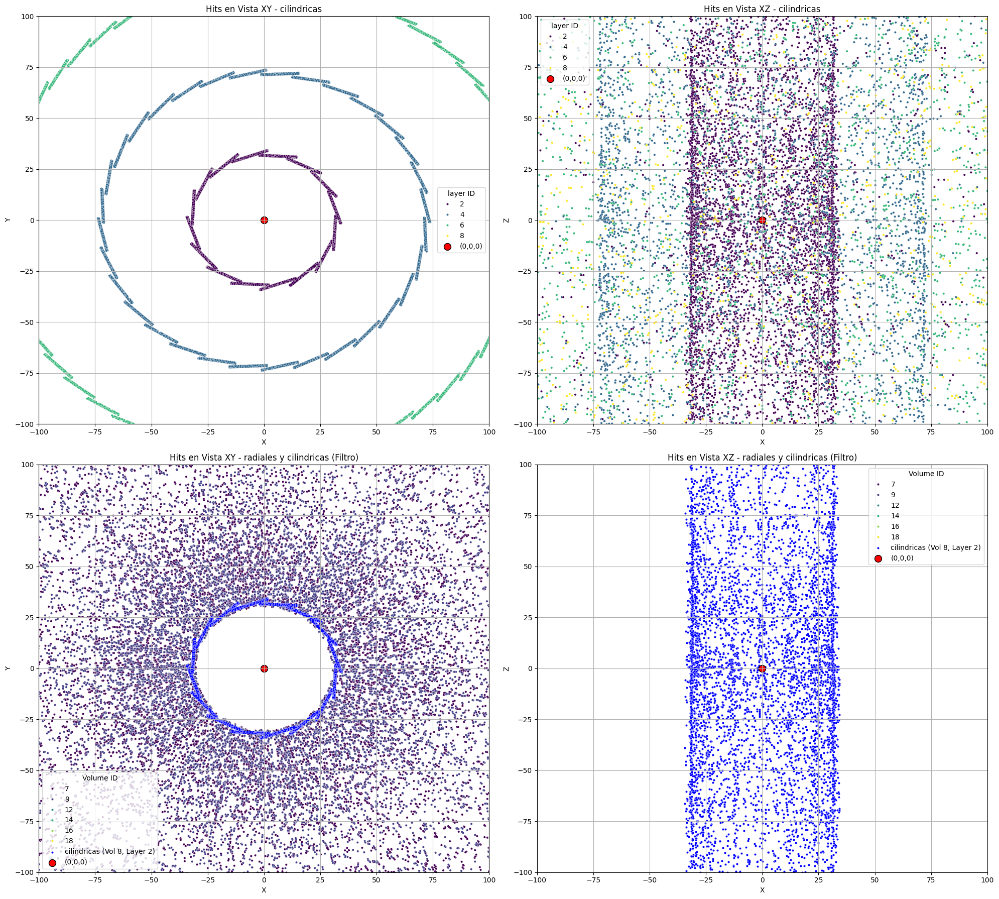

In [5]:
df_cilindricas = df[df['volume_id'].isin([8, 13, 17])]
df_radials = df[df['volume_id'].isin([18, 16, 14, 12, 9, 7])]

fig, axes = plt.subplots(2, 2, figsize=(20, 18))

sns.scatterplot(data=df_cilindricas, x='x', y='y', hue='layer_id', palette='viridis', s=10, ax=axes[0, 0])
axes[0, 0].scatter(0, 0, color='red', s=100, edgecolors='black', label='(0,0,0)')

axes[0, 0].set_xlabel('X')
axes[0, 0].set_ylabel('Y')
axes[0, 0].set_title('Hits en Vista XY - cilindricas')
axes[0, 0].legend(title='layer ID')
axes[0, 0].set_xlim(-100, 100)
axes[0, 0].set_ylim(-100, 100)
axes[0, 0].grid(True)

sns.scatterplot(data=df_cilindricas, x='x', y='z', hue='layer_id', palette='viridis', s=10, ax=axes[0, 1])
axes[0, 1].scatter(0, 0, color='red', s=100, edgecolors='black', label='(0,0,0)')

axes[0, 1].set_xlabel('X')
axes[0, 1].set_ylabel('Z')
axes[0, 1].set_title('Hits en Vista XZ - cilindricas')
axes[0, 1].legend(title='layer ID')
axes[0, 1].set_xlim(-100, 100)
axes[0, 1].set_ylim(-100, 100)
axes[0, 1].grid(True)

sns.scatterplot(data=df_radials, x='x', y='y', hue='volume_id', palette='viridis', s=10, ax=axes[1, 0])

sns.scatterplot(
    data=df_cilindricas[(df_cilindricas['volume_id'] == 8) & (df_cilindricas['layer_id'] == 2)],
    x='x', y='y', color='blue', s=10, ax=axes[1, 0], label='cilindricas (Vol 8, Layer 2)'
)

axes[1, 0].scatter(0, 0, color='red', s=100, edgecolors='black', label='(0,0,0)')


axes[1, 0].set_xlabel('X')
axes[1, 0].set_ylabel('Y')
axes[1, 0].set_title('Hits en Vista XY - radiales y cilindricas (Filtro)')
axes[1, 0].legend(title='Volume ID')
axes[1, 0].set_xlim(-100, 100)
axes[1, 0].set_ylim(-100, 100)
axes[1, 0].grid(True)


sns.scatterplot(data=df_radials, x='x', y='z', hue='volume_id', palette='viridis', s=10, ax=axes[1, 1])


sns.scatterplot(
    data=df_cilindricas[(df_cilindricas['volume_id'] == 8) & (df_cilindricas['layer_id'] == 2)],
    x='x', y='z', color='blue', s=10, ax=axes[1, 1], label='cilindricas (Vol 8, Layer 2)'
)

axes[1, 1].scatter(0, 0, color='red', s=100, edgecolors='black', label='(0,0,0)')


axes[1, 1].set_xlabel('X')
axes[1, 1].set_ylabel('Z')
axes[1, 1].set_title('Hits en Vista XZ - radiales y cilindricas (Filtro)')
axes[1, 1].legend(title='Volume ID')
axes[1, 1].set_xlim(-100, 100)
axes[1, 1].set_ylim(-100, 100)
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()



# División de batches espaciales

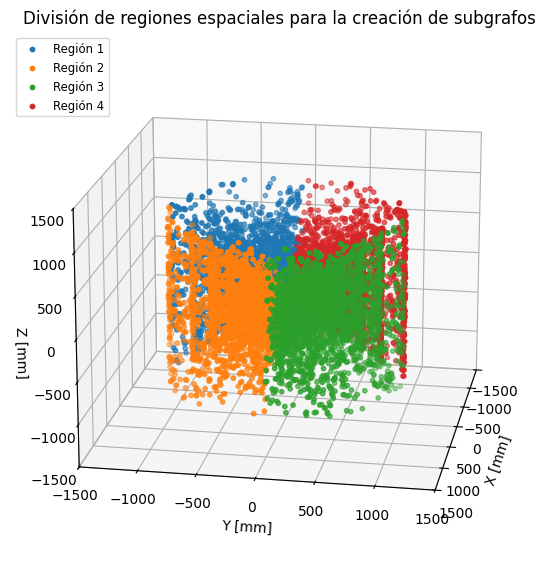

In [ ]:
def plot_hits_3d(df_list):
    fig = plt.figure(figsize=(7,7))
    ax = fig.add_subplot(111, projection='3d')

    # Parámetros del cilindro
    cyl_radius = 800
    cyl_half_height = 1000

    # Crear malla para el cilindro (solo una vez)
    u = np.linspace(0, 2*np.pi, 50)
    z_vals = np.linspace(-cyl_half_height, cyl_half_height, 20)
    U, Z = np.meshgrid(u, z_vals)
    X_cyl = cyl_radius * np.cos(U)
    Y_cyl = cyl_radius * np.sin(U)

    # Colormap para hasta 20 colores distintos
    cmap = plt.get_cmap('tab10')
    n_colors = cmap.N

    # Dibujar cada subgrafo con un color distinto
    for i, df in enumerate(df_list):
        x = df['r'] * np.cos(df['theta'])
        y = df['r'] * np.sin(df['theta'])
        z = df['z']

        color = cmap(i % n_colors)
        ax.scatter(x, y, z, color=color, s=10, label=f'Región {i+1}')

    ax.set_xlim(-1500, 1500)
    ax.set_ylim(-1500, 1500)
    ax.set_zlim(-1500, 1500)
    ax.view_init(elev=18, azim=10)

    ax.set_xlabel('X [mm]')
    ax.set_ylabel('Y [mm]')
    ax.set_zlabel('Z [mm]')
    ax.legend(loc='upper left', fontsize='small', markerscale=1)
    plt.title('División de regiones espaciales para la creación de subgrafos')

    plt.show()



df_list = space_batches(hits, truth, particles, n_event, dtheta=np.pi/2, dphi=np.pi)
plot_hits_3d(df_list)


# Grafica para ajuste de aperturas de conos de selección

In [ ]:



azmimtual_cut = np.pi/4

def angular_space_divisor(dtheta, dphi):

    if not (0 < dtheta <= 2*np.pi) or not (0 < dphi <= np.pi):
        raise ValueError("0 < dtheta ≤ 2π y 0 < dphi ≤ π")

    # Generamos los bordes de θ en [-π, π)
    thetas = np.arange(-np.pi, np.pi, dtheta)
    # Aseguramos incluir π como último borde
    if thetas[-1] < np.pi:
        thetas = np.append(thetas, np.pi)

    # Generamos los bordes de φ en [0, π]
    phis = np.arange(0, np.pi, dphi)
    if phis[-1] < np.pi:
        phis = np.append(phis, np.pi)

    return [
        (t0, t1, p0, p1)
        for t0, t1 in zip(thetas[:-1], thetas[1:])
        for p0, p1 in zip(phis[:-1],   phis[1:])]


def space_batches(hits, truth, particles, n_event, dtheta, dphi): # GeV
    # Momento tranverso en particles
    particles['pt'] = np.sqrt(particles.px**2 + particles.py**2)

    #particles = particles[(particles['pt']> pt_min) & (particles['pt']< pt_max)] # filtramos rango de momentos
    # Truth relaciona hit_id con particle_id, le añadimos los pt de las particulas seleccionadas
    truth = (truth[['hit_id', 'particle_id']].merge(particles[['particle_id', 'pt']], on='particle_id'))

    # Tomamos los barrel, están ordenadas de interno a externo
    barrels = [(8,2), (8,4), (8,6), (8,8), (13,2), (13,4), (13,6), (13,8), (17,2), (17,4)]
    groups = hits.groupby(['volume_id', 'layer_id'])
    hits = pd.concat([groups.get_group(barrels[i]).assign(layer=i) for i in range(len(barrels))]) # Llamamos a las capas ordinalmente
    hits['r'], hits['theta'] = np.sqrt(hits.x**2 + hits.y**2), np.arctan2(hits.y, hits.x) # cilíndricas
    hits['phi'] = np.arccos(hits.z/np.sqrt(hits.r**2+hits.z**2)) # añadimos phi esférica, para usarla en vez de z en la division por conos
    hits = hits[(hits['phi'] >= azmimtual_cut) & (hits['phi'] <= np.pi - azmimtual_cut)] #tomo trayectorias que pueden pasar por 10 capas (las capas ams internas son menos anchas)
    #hits = hits[(hits['phi'] >= np.pi/4) & (hits['phi'] <= np.pi - np.pi/4)]

    # Añadimos a hits el particle_id y el pt que agrupamos en truth
    hits = (hits[['hit_id', 'r', 'theta', 'z', 'phi', 'layer']].merge(truth[['hit_id', 'particle_id', 'pt']], on='hit_id'))
    hits = hits[['hit_id', 'particle_id', 'r', 'theta', 'z', 'phi', 'pt', 'layer']] # Reordenamos las columnas
    hits = hits.assign(n_event=int(n_event))

    cells = angular_space_divisor(dtheta, dphi) # lista noc las celdas dtheta,dphi que determinan la base d elos conos de base cuadrada
    cones = []
    selection_cones_axis_angles = [] # guarda el angulo del eje de los conos de selección para la conexion de nodos en segments
    # nos quedamos con los hits dentro de cada cono
    for theta_min, theta_max, phi_min, phi_max in cells:
        mask_theta = (hits['theta'] >= theta_min) & (hits['theta'] < theta_max)
        # Para φ: idem, cerrado por la izquierda, abierto por la derecha
        mask_phi   = (hits['phi']   >= phi_min)   & (hits['phi']   < phi_max)
        sub_hits = hits[mask_phi & mask_theta]
        
        # si las celdas estan muy en los extremos, hay regiones donde no hay hits
        if not sub_hits.empty: # solo los dataframes con hits
            #sub_hits = sub_hits.drop(columns=['phi']) # phi solo servía para crear los batches espaciales, pero lo usamosa par ael cono de seleccion
            cones.append(sub_hits)
            selection_cones_axis_angles.append(abs(phi_max+phi_min)/2)   
    return cones


def get_segments_batches(hits, cone_angles, pt_min, pt_max):

    hits = hits.reset_index(drop=True).copy()
    hits['orig_idx'] = np.arange(len(hits))

    N = len(hits)
    alive_mask = np.zeros(N, dtype=bool)
    alive_mask[hits['layer'].to_numpy() == 0] = True

    connections = []

    for inner_layer in range(0, 10):
        outer_layer = inner_layer + 1

        layer_arr = hits['layer'].to_numpy()
        idx_inner = np.nonzero(alive_mask & (layer_arr == inner_layer))[0]
        if idx_inner.size == 0:
            break
        idx_outer = np.nonzero(layer_arr == outer_layer)[0]

        inner = hits.iloc[idx_inner].reset_index(drop=True)
        outer = hits.iloc[idx_outer].reset_index(drop=True)

        pairs = pd.merge(
            inner, outer,
            on='n_event',
            suffixes=('_in','_out')
        )


        pairs['phi_in']  = ((pairs.theta_in  + np.pi) % (2*np.pi)) - np.pi
        pairs['phi_out'] = ((pairs.theta_out + np.pi) % (2*np.pi)) - np.pi
        eta_in  = -np.log(np.tan(0.5 * np.arccos(
            pairs.z_in  / np.sqrt(pairs.r_in**2  + pairs.z_in**2 )
        )))
        eta_out = -np.log(np.tan(0.5 * np.arccos(
            pairs.z_out / np.sqrt(pairs.r_out**2 + pairs.z_out**2)
        )))
        pairs['delta_eta'] = eta_out - eta_in
        pairs['delta_phi'] = ((pairs.phi_out - pairs.phi_in + np.pi) % (2*np.pi)) - np.pi


        r1, r2 = pairs.r_in.to_numpy(), pairs.r_out.to_numpy()
        z1, z2 = pairs.z_in.to_numpy(), pairs.z_out.to_numpy()
        x1 = r1 * np.cos(pairs.theta_in)
        y1 = r1 * np.sin(pairs.theta_in)
        x2 = r2 * np.cos(pairs.theta_out)
        y2 = r2 * np.sin(pairs.theta_out)

        dx, dy, dz = x2-x1, y2-y1, z2-z1
        dot   = x1*dx + y1*dy + z1*dz
        norm1 = x1**2 + y1**2 + z1**2
        norm2 = dx**2 + dy**2 + dz**2
        cos_theta = dot / (np.sqrt(norm1*norm2) + 1e-9)


        cos_z = z1 / (np.sqrt(norm1) + 1e-9)
        sin_z = np.sqrt(np.clip(1 - cos_z**2, 0, 1))

        eff_ap = cone_angles * sin_z
        cos_alpha = np.cos(eff_ap/2)

        # Filtrado por cono
        mask_cone = cos_theta >= cos_alpha
        filtered = pairs.loc[mask_cone].copy()

        filtered['label'] = (
            (filtered.particle_id_in == filtered.particle_id_out) &
            (filtered.particle_id_in != 0)
        )

        connections.append(filtered[[
            'n_event',
            'hit_id_in','particle_id_in','layer_in','r_in','theta_in','z_in','pt_in',
            'hit_id_out','particle_id_out','layer_out','r_out','theta_out','z_out','pt_out',
            'delta_eta','delta_phi','label'
        ]])

        alive_mask[ filtered['orig_idx_out'].to_numpy() ] = True

    segments = pd.concat(connections, ignore_index=True)
    mask_pt = (
        (segments.pt_in  >= pt_min) & (segments.pt_in  <= pt_max) &
        (segments.pt_out >= pt_min) & (segments.pt_out <= pt_max)
    )
    return segments.loc[mask_pt].reset_index(drop=True)


def graph_builder(segments, drop_y=False):

    node_feats = ['r', 'theta', 'z', 'layer']
    edge_feats = ['delta_eta', 'delta_phi']

    hits_in = segments[['hit_id_in'] + [f"{f}_in" for f in node_feats]].rename(
        columns={**{f"{f}_in": f for f in node_feats}, 'hit_id_in': 'hit_id'})
    hits_out = segments[['hit_id_out'] + [f"{f}_out" for f in node_feats]].rename(
        columns={**{f"{f}_out": f for f in node_feats}, 'hit_id_out': 'hit_id'})
    
    def compute_eta(r, z):
        return -np.log(np.tan(0.5 * np.arccos(z / np.sqrt(r**2 + z**2))))


    hits_in['eta'] = compute_eta(hits_in['r'], hits_in['z'])
    hits_out['eta'] = compute_eta(hits_out['r'], hits_out['z'])

    hits_all = pd.concat([hits_in, hits_out], ignore_index=True)
    hits_all = hits_all.drop_duplicates('hit_id').reset_index(drop=True)
    hits_all = hits_all.sort_values('r').reset_index(drop=True)
    hits_all['node_idx'] = hits_all.index
    
    x = torch.tensor(
        hits_all[['r','theta','z']].values,
        dtype=torch.float) 

    layer_feat = torch.tensor(hits_all['layer'].values, dtype=torch.float).unsqueeze(1) / 9.0
    x = torch.tensor(hits_all[['r','theta','z']].values, dtype=torch.float)
    x = torch.cat([x, layer_feat], dim=1)

    id2idx = dict(zip(hits_all['hit_id'], hits_all['node_idx']))

    src = segments['hit_id_in'].map(id2idx).values
    dst = segments['hit_id_out'].map(id2idx).values
    
    graph = Data(
        x=x,
        edge_index=torch.tensor(np.array([src, dst]), dtype=torch.long), 
        edge_attr=torch.tensor(segments[edge_feats].values, dtype=torch.float),
        hit_id = torch.tensor(hits_all['hit_id'].values, dtype=torch.long),
        layer=torch.tensor(hits_all['layer'].astype(int).values, dtype=torch.long),
        y=torch.tensor(segments['label'].astype(int).values, dtype=torch.long))
    
    if drop_y:
        delattr(graph, 'y') 

    def normalize_graph_features(graph):
        node_ranges = {
            'r': (0, 1800),
            'theta': (-np.pi, np.pi),
            'z': (-1250, 1250),
            'layer': (0, 10)  
        }
        edge_ranges = {
            'dr': (-1800, 1800),
            'dz': (-1250, 1250),
            'dtheta': (-np.pi, np.pi),
            'var_theta': (-1, 1),
            'z0': (-1250, 1250)
        }

        x = graph.x.clone().float()

    
        for i, k in enumerate(node_ranges):
            mn, mx = node_ranges[k]
            x[:, i] = (x[:, i] - mn) / (mx - mn)
        graph.x = x

        edge_attr = graph.edge_attr.clone().float()
        for i, k in enumerate(edge_ranges):
            mn, mx = edge_ranges[k]
            edge_attr[:, i] = (edge_attr[:, i] - mn) / (mx - mn)
        graph.edge_attr = edge_attr

        return graph
    return graph

def process_event_batches(n_event, cone_angle, drop_y, get_true_tracks,dtheta, dphi, pt_min = 0.57, pt_max = 1000, path = 'data/events'):
    hits = pd.read_csv(f'{path}/event{n_event}-hits.csv')
    particles = pd.read_csv(f'{path}/event{n_event}-particles.csv')
    truth = pd.read_csv(f'{path}/event{n_event}-truth.csv')

    minibatches = space_batches(hits, truth, particles, n_event, dtheta, dphi) # Filtramos hits y añadimos pt y layer
    graphs = []
    for minibatch in minibatches:
        graphs.append(graph_builder(get_segments_batches(minibatch, cone_angle, pt_min, pt_max), drop_y))

    if get_true_tracks:


        particles = pd.read_csv(f'{path}/event{n_event}-particles.csv')
        truth = pd.read_csv(f'{path}/event{n_event}-truth.csv')

   
        particles['pt'] = np.sqrt(particles.px**2 + particles.py**2)
        particles_filt = particles[(particles['pt'] > pt_min) & (particles['pt'] < pt_max)]


        merged = pd.merge(truth[['hit_id', 'particle_id']], particles_filt[['particle_id', 'pt', 'q']], on='particle_id', how='inner')


        barrels = [(8,2), (8,4), (8,6), (8,8), (13,2), (13,4), (13,6), (13,8), (17,2), (17,4)]
        groups = hits.groupby(['volume_id', 'layer_id'])
        hits = pd.concat([groups.get_group(barrels[i]).assign(layer=i) for i in range(len(barrels))])
        hits['r'] = np.sqrt(hits.x**2 + hits.y**2)
        hits['theta'] = np.arctan2(hits.y, hits.x)
        hits['phi'] = np.arccos(hits.z / np.sqrt(hits.r**2 + hits.z**2))

        hits = hits[(hits['phi'] >= azmimtual_cut) & (hits['phi'] <= np.pi - azmimtual_cut)]

        df = pd.merge(merged, hits[['hit_id', 'r', 'theta', 'z', 'layer']], on='hit_id', how='inner')

        unique_particles = sorted(df['particle_id'].unique())
        mapping = {pid: idx + 1 for idx, pid in enumerate(unique_particles)}
        df['track_id'] = df['particle_id'].map(mapping)

        initial_ids = set(df['track_id'].unique())
        valid_start_ids = df[df.layer.isin([0, 1, 2])]['track_id'].unique()
        df = df[df.track_id.isin(valid_start_ids)]
        removed_start = initial_ids - set(valid_start_ids)
        print(f"Tracks descartados por no empezar en capas 0, 1 o 2: {len(removed_start)}")

        def is_consec(layers):
            L = sorted(set(layers))
            return L == list(range(L[0], L[-1] + 1))

        consec_ids = [tid for tid, g in df.groupby('track_id') if is_consec(g['layer'])]
        before_consec = set(df.track_id.unique())
        df = df[df.track_id.isin(consec_ids)]
        removed_consec = before_consec - set(consec_ids)
        print(f"Tracks descartados por capas no consecutivas: {len(removed_consec)}")
        df = df.sort_values(by=['track_id', 'layer', 'r'])  
        df = df.drop_duplicates(subset=['track_id', 'layer'], keep='first')
        track_counts = df.track_id.value_counts()
        valid_len_ids = track_counts[(track_counts >= 7) & (track_counts <= 10)].index
        before_len = set(df.track_id.unique())
        df = df[df.track_id.isin(valid_len_ids)]
        removed_len = before_len - set(valid_len_ids)
        print(f"Tracks descartados por no tener entre 7 y 10 hits: {len(removed_len)}")

        new_ids = {tid: i+1 for i, tid in enumerate(sorted(df['track_id'].unique()))}
        df['track_id'] = df['track_id'].map(new_ids)

        result = df[['hit_id', 'r', 'theta', 'z', 'track_id', 'pt', 'q']].copy()
        ground_tracks = result.sort_values('track_id').reset_index(drop=True)

    
    else:
        ground_tracks = None

    
    return graphs, ground_tracks

,angle,layer,total,true,false
0,0.314159,0,1286,396,890
1,0.314159,1,882,484,398
2,0.314159,2,805,519,286
3,0.314159,3,791,485,306
4,0.314159,4,543,340,203
...,...,...,...,...,...
175,1.570796,4,7068,508,6560
176,1.570796,5,7074,503,6571
177,1.570796,6,5257,480,4777
178,1.570796,7,3389,436,2953


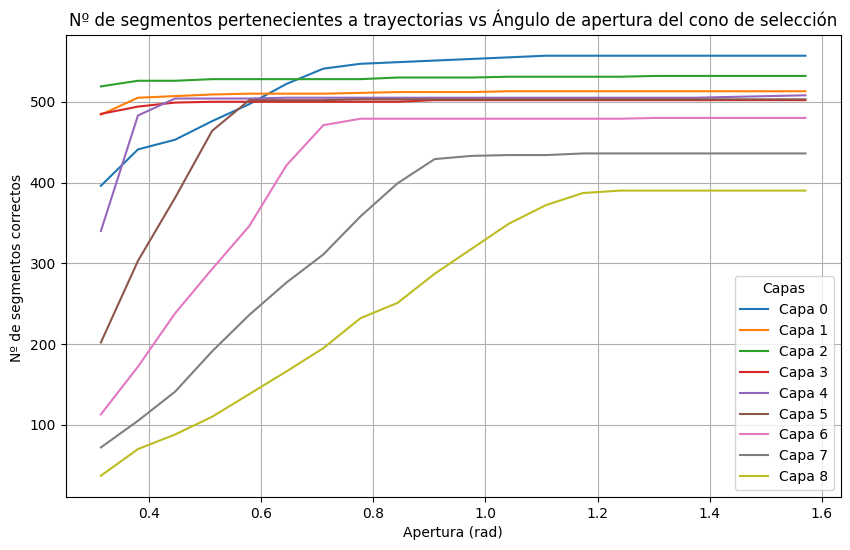

In [ ]:

n_event = '000001000'
pt_min, pt_max = 0.57, 1000
max_layer = 8

# Grid de ángulos (10 valores equiespaciados de pi/7 a pi)
angles = np.linspace(np.pi/10, np.pi/2, 20)

records = []

def count_nodes_per_layer(data, max_layer=8):
    src = data.edge_index[0]
    labels = data.y.bool()
    layers = data.layer
    total, true_n, false_n = {}, {}, {}
    for L in range(max_layer + 1):
        mask = (layers[src] == L)
        total[L]   = torch.sum(mask).item()
        true_n[L]  = torch.sum(mask & labels).item()
        false_n[L] = torch.sum(mask & ~labels).item()
    return total, true_n, false_n

for theta in angles:
    graphs, _ = process_event_batches(
        n_event,
        cone_angle=theta,
        drop_y=False,
        get_true_tracks=False,
        dtheta=np.pi,
        dphi=np.pi,
        pt_min=pt_min,
        pt_max=pt_max)
    g = graphs[0]
    tot, tru, fal = count_nodes_per_layer(g, max_layer)
    for L in range(max_layer + 1):
        records.append({
            'angle': theta,
            'layer': L,
            'total': tot[L],
            'true':  tru[L],
            'false': fal[L]
        })


df = pd.DataFrame(records)


display(df)


plt.figure(figsize=(10,6))

for L in range(max_layer + 1):
    sub = df[df['layer'] == L]
    plt.plot(sub['angle'], sub['true'], label=f'Capa {L}')

plt.title("Nº de segmentos pertenecientes a trayectorias vs Ángulo de apertura del cono de selección")
plt.xlabel("Apertura (rad)")
plt.ylabel("Nº de segmentos correctos ")
plt.legend(title="Capas")
plt.grid(True)
plt.show()

In [14]:
best_angles_simple = {}

for L in df['layer'].unique():
    sub = df[df['layer'] == L]
    
    max_true = sub['true'].max()
    threshold = 0.95 * max_true  # conservar al menos 95% de los verdaderos máximos
    
    filtered = sub[sub['true'] >= threshold]
    
    if not filtered.empty:
        min_angle_idx = filtered['angle'].idxmin()
        best_row = filtered.loc[min_angle_idx]
        
        best_angles_simple[L] = best_row['angle']
    else:
        best_angles_simple[L] = None

print(best_angles_simple)
# diccionario con los angulos por capa

{0: 0.7109920216019006, 1: 0.38029805806613287, 2: 0.3141592653589793, 3: 0.3141592653589793, 4: 0.38029805806613287, 5: 0.5787144361875936, 6: 0.7109920216019006, 7: 0.9094083997233612, 8: 1.1078247778448218}


[Data(x=[18958, 4], edge_index=[2, 53310], edge_attr=[53310, 2], y=[53310], hit_id=[18958], layer=[18958])]


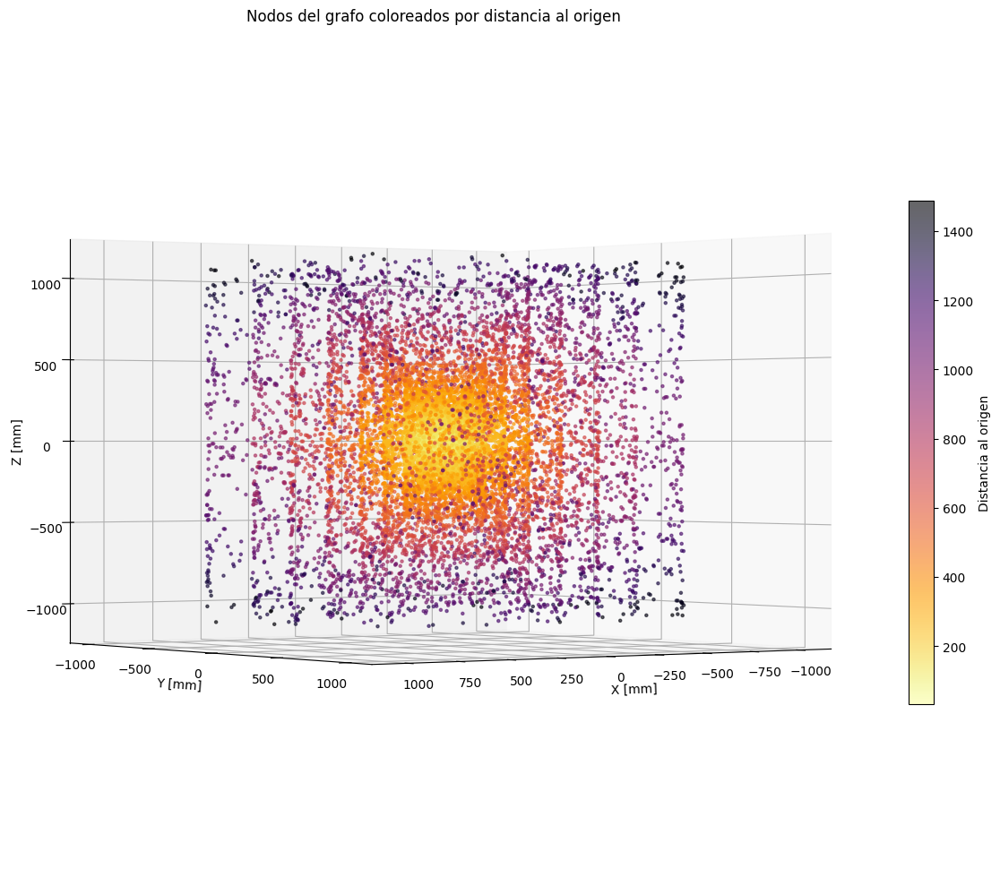

In [2]:
ground_graphs, ground_tracks = process_event_batches(n_event, drop_y=False, dtheta=np.pi*2, dphi=np.pi, pt_min=0.5, pt_max = 1000, get_true_tracks = False)
print(ground_graphs)

def plot_graph_cylindrical_3d(data, node_size=5, alpha=0.6, cmap='inferno_r', elev=30, azim=45):

    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D

    # Coordenadas cilíndricas
    r = data.x[:, 0]
    phi = data.x[:, 1]
    z = data.x[:, 2]

    # Convertir a cartesianas
    x = r * torch.cos(phi)
    y = r * torch.sin(phi)

    # Convertir a numpy
    x = x.cpu().numpy()
    y = y.cpu().numpy()
    z = z.cpu().numpy()

    # Calcular la distancia al origen en 3D
    distance = np.sqrt(x**2 + y**2 + z**2)

    # Graficar
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(x, y, z, c=distance, s=node_size, alpha=alpha, cmap=cmap)

    # Configurar cámara
    ax.view_init(elev=elev, azim=azim)

    ax.set_xlabel('X [mm]')
    ax.set_ylabel('Y [mm]')
    ax.set_zlabel('Z [mm]')
    plt.title('Nodos del grafo coloreados por distancia al origen')
    plt.colorbar(sc, ax=ax, label='Distancia al origen', fraction=0.02, pad=0.04)
    plt.tight_layout()
    plt.show()


plot_graph_cylindrical_3d(denormalize_graph(ground_graphs[0]), elev=0, azim=55)